In [1]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import sys
import numpy as np
import numpy as np
sc.set_figure_params(dpi=100, dpi_save=300, frameon=False, )
import shutup; shutup.please()
from cnmf import cNMF
from pathlib import Path
from IPython.display import Image

In [2]:
adata = sc.read_h5ad('../Classifier/scpoli_donor_final_integration.h5ad')

In [15]:
! lscpu

Architecture:        x86_64
CPU op-mode(s):      32-bit, 64-bit
Byte Order:          Little Endian
CPU(s):              128
On-line CPU(s) list: 0-127
Thread(s) per core:  2
Core(s) per socket:  32
Socket(s):           2
NUMA node(s):        2
Vendor ID:           AuthenticAMD
CPU family:          25
Model:               1
Model name:          AMD EPYC 7513 32-Core Processor
Stepping:            1
CPU MHz:             3541.141
CPU max MHz:         2600.0000
CPU min MHz:         1500.0000
BogoMIPS:            5190.50
Virtualization:      AMD-V
L1d cache:           32K
L1i cache:           32K
L2 cache:            512K
L3 cache:            32768K
NUMA node0 CPU(s):   0-31,64-95
NUMA node1 CPU(s):   32-63,96-127
Flags:               fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ht syscall nx mmxext fxsr_opt pdpe1gb rdtscp lm constant_tsc rep_good nopl nonstop_tsc cpuid extd_apicid aperfmperf pni pclmulqdq monitor ssse3 fma cx16 pcid sse4

In [ ]:
# adata_subset = sc.pp.subsample(adata, fraction=0.1, copy=True)
# adata_subset.write('../cNMF/test.h5ad')

In [12]:
numiter=20 ## Set this to a larger value for real data. We set this to a low value here for illustration
numworkers=120 ## Set this to a larger value and use the parallel code cells to try out parallelization
K = ' '.join([str(i) for i in range(5,15)])
print(K)

5 6 7 8 9 10 11 12 13 14


In [7]:
pwd

'/home/aih/shrey.parikh/PDAC/PDAC/final_code'

In [6]:
output_directory = '../cNMF/'
run_name = 'full_cNMF'
countfn = '../Classifier/scpoli_donor_final_integration.h5ad'
seed = 14

In [ ]:
import shutil
shutil.copy('/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/cnmf/cnmf.py', '../cNMF/cnmf.py')

In [10]:
prepare_cmd = 'python ../cNMF/cnmf.py prepare --output-dir %s --name %s -c %s -k %s --n-iter %d --total-workers %d --seed %d --beta-loss frobenius' % (output_directory, run_name, countfn, K, numiter, numworkers, seed)
print('Prepare command assuming parallelization with %d cores:\n%s' % (numworkers, prepare_cmd))
! {prepare_cmd}

Prepare command assuming parallelization with 96 cores:
python ../cNMF/cnmf.py prepare --output-dir ../cNMF/ --name full_cNMF -c ../Classifier/scpoli_donor_final_integration.h5ad -k 5 6 7 8 9 10 11 12 13 14 --n-iter 20 --total-workers 96 --seed 14 --beta-loss frobenius


/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/_core/anndata.py:1906: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/_core/anndata.py:1906: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3

In [13]:
factorize_cmd = 'python ../cNMF/cnmf.py factorize --output-dir %s --name %s --worker-index 0' % (output_directory, run_name)
print('Factorize command for worker 0:\n%s' % factorize_cmd)
! {factorize_cmd}

Factorize command for worker 0:
python ../cNMF/cnmf.py factorize --output-dir ../cNMF/ --name full_cNMF --worker-index 0


/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/_core/anndata.py:1906: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
[Worker 0]. Starting task 0.
[Worker 0]. Starting task 1.
[Worker 0]. Starting task 2.
[Worker 0]. Starting task 3.
[Worker 0]. Starting task 4.
[Worker 0]. Starting task 5.
[Worker 0]. Starting task 6.
[Worker 0]. Starting task 7.
[Worker 0]. Starting task 8.
[Worker 0]. Starting task 9.
[Work

In [ ]:
# numiter=20 ## Set this to a larger value for real data. We set this to a low value here for illustration
# numworkers=20 ## Set this to a larger value and use the parallel code cells to try out parallelization
# K = ' '.join([str(i) for i in range(5,10)])
# print(K)
# prepare_cmd = 'python path_cnmf prepare --output-dir %s --name %s -c %s -k %s --n-iter %d --total-workers %d --seed %d --beta-loss frobenius' % (output_directory, run_name, countfn, K, numiter, numworkers, seed)
# print('Prepare command assuming parallelization with %d cores:\n%s' % (numworkers, prepare_cmd))
# # ! {prepare_cmd}
# ## Using GNU parallel
# ## This took 4 minutes in our testing
# worker_index = ' '.join([str(x) for x in range(numworkers)])
# factorize_cmd = 'nohup parallel python /home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/cnmf/cnmf.py factorize --output-dir %s --name %s --worker-index {} ::: %s' % (output_directory, run_name, worker_index)
# print('Factorize command to simultaneously run factorization over %d cores using GNU parallel:\n%s' % (numworkers, factorize_cmd))
# !{factorize_cmd}

5 6 7 8 9


In [14]:
cmd = 'python ../cNMF/cnmf.py combine --output-dir %s --name %s' % (output_directory, run_name)
print(cmd)
!{cmd}

python /home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/cnmf/cnmf.py combine --output-dir ../cNMF/ --name full_cNMF
Combining factorizations for k=5.
Combining factorizations for k=6.
Combining factorizations for k=7.
Combining factorizations for k=8.
Combining factorizations for k=9.
Combining factorizations for k=10.
Combining factorizations for k=11.
Combining factorizations for k=12.
Combining factorizations for k=13.
Combining factorizations for k=14.


In [15]:
worker_index = ' '.join([str(x) for x in range(numworkers)])
kselect_plot_cmd = 'python ../cNMF/cnmf.py k_selection_plot --output-dir %s --name %s' % (output_directory, run_name)
print('K selection plot command: %s' % kselect_plot_cmd)
!{kselect_plot_cmd}

K selection plot command: python ../cNMF/cnmf.py k_selection_plot --output-dir ../cNMF/ --name full_cNMF


/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/_core/anndata.py:1906: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-

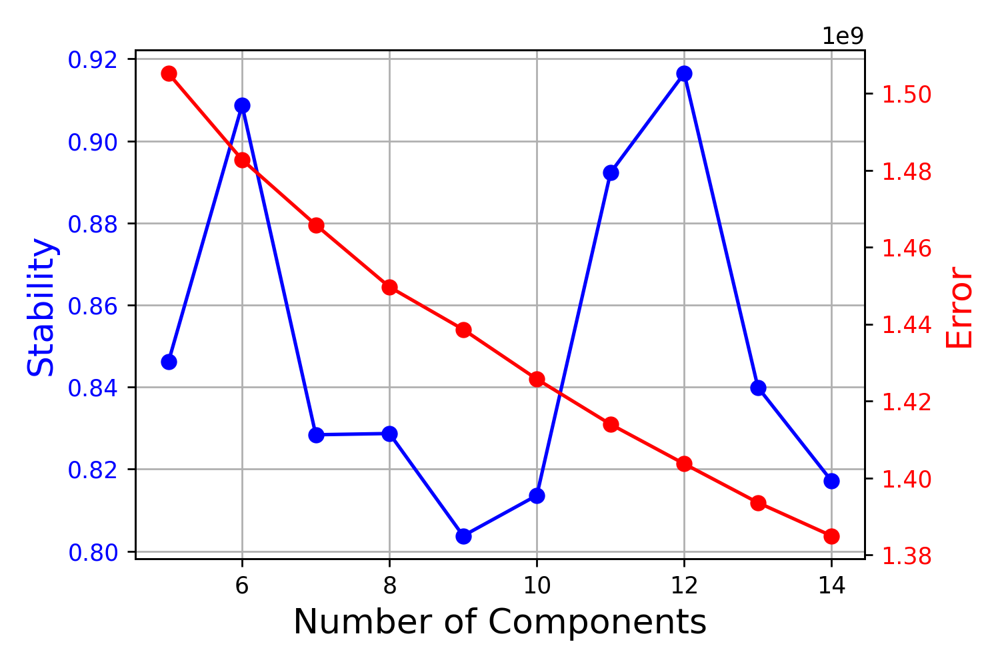

In [16]:
Image(filename = "/home/aih/shrey.parikh/PDAC/PDAC/cNMF/full_cNMF/full_cNMF.k_selection.png", width=1000, height=1000)

In [17]:
selected_K = 12
density_threshold = 2.00

In [18]:
## This is the command you would run from the command line to obtain the consensus estimate with no filtering
## and to save a diagnostic plot as a PDF
consensus_cmd = 'python ../cNMF/cnmf.py consensus --output-dir %s --name %s --local-density-threshold %.2f --components %d --show-clustering' % (output_directory, run_name, density_threshold, selected_K)
print('Consensus command for K=6:\n%s' % consensus_cmd)
!{consensus_cmd}

Consensus command for K=6:
python ../cNMF/cnmf.py consensus --output-dir ../cNMF/ --name full_cNMF --local-density-threshold 2.00 --components 12 --show-clustering


/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/_core/anndata.py:1906: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-

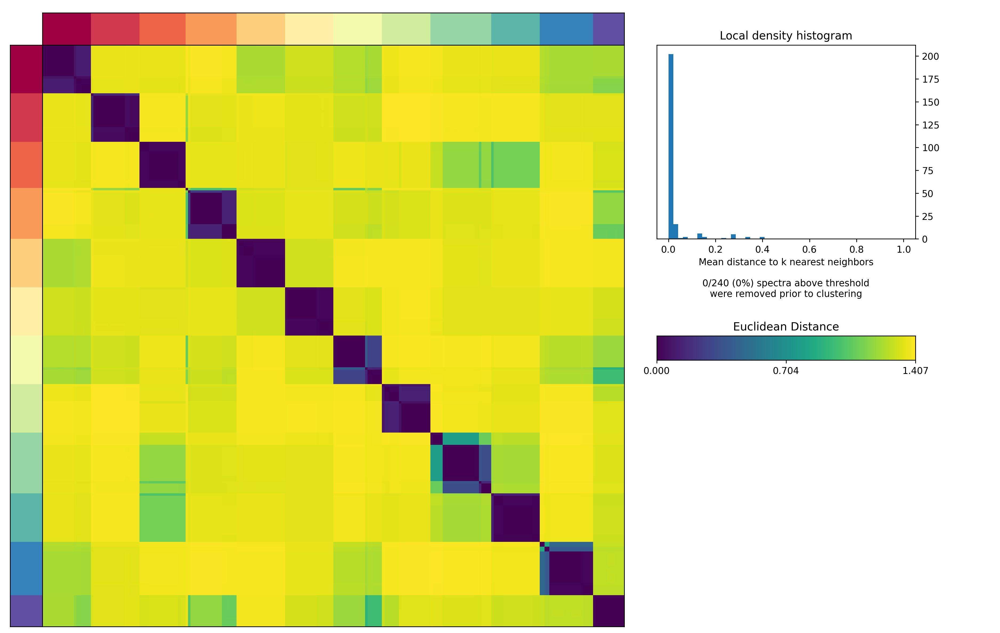

In [19]:
density_threshold_str = ('%.2f' % density_threshold).replace('.', '_')
Image(filename = "/home/aih/shrey.parikh/PDAC/PDAC/cNMF/full_cNMF/full_cNMF.clustering.k_12.dt_2_0.png",
      width=1000, height=1000)

In [20]:
density_threshold = 0.10
consensus_cmd = 'python ../cNMF/cnmf.py consensus --output-dir %s --name %s --local-density-threshold %.2f --components %d --show-clustering' % (output_directory, run_name, density_threshold, selected_K)
print('Consensus command for K=%d:\n%s' % (selected_K, consensus_cmd))
!{consensus_cmd}

Consensus command for K=12:
python ../cNMF/cnmf.py consensus --output-dir ../cNMF/ --name full_cNMF --local-density-threshold 0.10 --components 12 --show-clustering


/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/_core/anndata.py:1906: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-

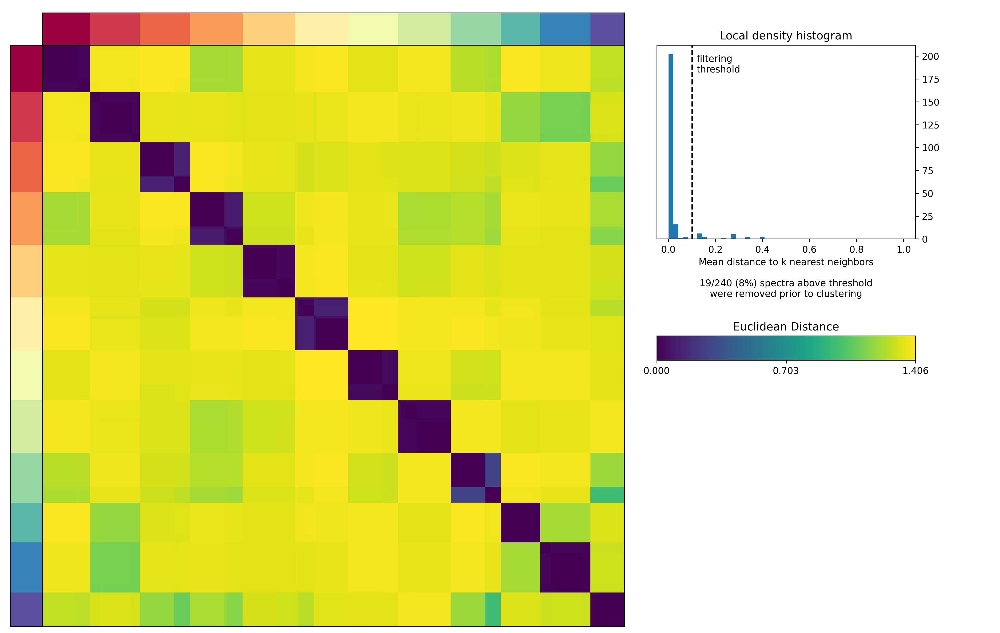

In [21]:
Image(filename = "/home/aih/shrey.parikh/PDAC/PDAC/cNMF/full_cNMF/full_cNMF.clustering.k_12.dt_0_1.png",
      width=1000, height=1000)

In [3]:
usage = pd.read_csv("/home/aih/shrey.parikh/PDAC/PDAC/cNMF/full_cNMF/full_cNMF.usages.k_12.dt_0_1.consensus.txt",
                    sep='\t', index_col=0)
usage.columns = ['Usage_%s' % i for i in usage.columns]
usage.head()

,Usage_1,Usage_2,Usage_3,Usage_4,Usage_5,Usage_6,Usage_7,Usage_8,Usage_9,Usage_10,Usage_11,Usage_12
cell_barcode,,,,,,,,,,,,
AAACCCAAGTCATCGT-1-HT056P-S1PAA1-0-0-0,0.073774,0.029422,0.429288,0.012979,0.000000,0.051589,0.333551,0.0,0.022877,0.000000,0.032569,0.000000
AAACCCACAACCACGC-1-HT056P-S1PAA1-0-0-0,0.172376,0.000000,0.012839,0.000000,0.140077,0.707559,0.009637,0.0,0.000000,0.000000,0.003266,0.000000
AAACCCACAACTCCCT-1-HT056P-S1PAA1-0-0-0,0.792778,0.000000,0.054116,0.000000,0.000000,0.019217,0.030848,0.0,0.013600,0.010191,0.022465,0.000526
AAACCCACAGACAATA-1-HT056P-S1PAA1-0-0-0,0.650193,0.018531,0.061011,0.000000,0.000000,0.014853,0.040927,0.0,0.023744,0.011668,0.016705,0.004181
AAACCCACATGCCGAC-1-HT056P-S1PAA1-0-0-0,0.930186,0.012101,0.019352,0.018739,0.000000,0.000000,0.064435,0.0,0.000000,0.000000,0.042133,0.000000


In [4]:
usage_norm = usage.div(usage.sum(axis=1), axis=0)
usage_norm.head()

,Usage_1,Usage_2,Usage_3,Usage_4,Usage_5,Usage_6,Usage_7,Usage_8,Usage_9,Usage_10,Usage_11,Usage_12
cell_barcode,,,,,,,,,,,,
AAACCCAAGTCATCGT-1-HT056P-S1PAA1-0-0-0,0.074818,0.029838,0.435361,0.013162,0.000000,0.052319,0.338271,0.0,0.023201,0.000000,0.033030,0.000000
AAACCCACAACCACGC-1-HT056P-S1PAA1-0-0-0,0.164834,0.000000,0.012277,0.000000,0.133948,0.676602,0.009216,0.0,0.000000,0.000000,0.003123,0.000000
AAACCCACAACTCCCT-1-HT056P-S1PAA1-0-0-0,0.840038,0.000000,0.057342,0.000000,0.000000,0.020362,0.032687,0.0,0.014410,0.010798,0.023804,0.000558
AAACCCACAGACAATA-1-HT056P-S1PAA1-0-0-0,0.772373,0.022013,0.072475,0.000000,0.000000,0.017644,0.048617,0.0,0.028205,0.013860,0.019844,0.004967
AAACCCACATGCCGAC-1-HT056P-S1PAA1-0-0-0,0.855779,0.011133,0.017804,0.017240,0.000000,0.000000,0.059281,0.0,0.000000,0.000000,0.038763,0.000000


In [5]:
for cols in usage_norm.columns:
    adata.obs[cols] = usage_norm[cols]

In [6]:
usage_norm.columns

Index(['Usage_1', 'Usage_2', 'Usage_3', 'Usage_4', 'Usage_5', 'Usage_6',
       'Usage_7', 'Usage_8', 'Usage_9', 'Usage_10', 'Usage_11', 'Usage_12'],
      dtype='object')

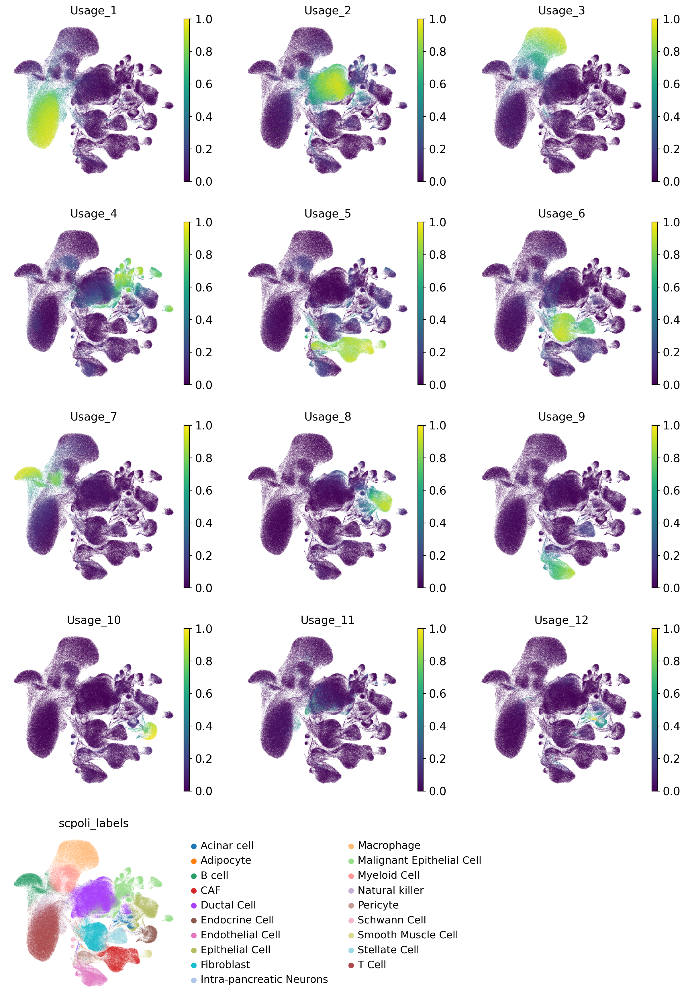

In [7]:
sc.pl.umap(adata, color=['Usage_1', 'Usage_2', 'Usage_3', 'Usage_4', 'Usage_5', 'Usage_6',
       'Usage_7', 'Usage_8', 'Usage_9', 'Usage_10', 'Usage_11', 'Usage_12', 'scpoli_labels'], 
       ncols=3, vmin=0, vmax=1)

In [9]:
gene_scores = pd.read_csv("/home/aih/shrey.parikh/PDAC/PDAC/cNMF/full_cNMF/full_cNMF.spectra.k_12.dt_0_1.consensus.txt",
                    sep='\t', index_col=0).T
gene_scores.head()

,1,2,3,4,5,6,7,8,9,10,11,12
A1BG,0.000974,0.000000,0.000790,0.000000,0.000000,0.002853,0.001446,0.000054,0.000205,0.000164,0.000000,0.000138
A2M-AS1,0.001161,0.000000,0.000026,0.000095,0.000068,0.000228,0.000357,0.000035,0.000070,0.000048,0.000000,0.000031
AATK,0.000000,0.000699,0.000478,0.001284,0.000161,0.000000,0.000000,0.000353,0.000292,0.001310,0.000032,0.001782
ABCA7,0.000311,0.000830,0.000357,0.002445,0.000049,0.000000,0.000371,0.000000,0.000117,0.000772,0.000314,0.000080
ABCB1,0.000999,0.000000,0.000000,0.000193,0.000313,0.000000,0.000093,0.001611,0.005464,0.000853,0.000000,0.000000


In [10]:
top_genes = []
ngenes = 20
for gep in gene_scores.columns:
    top_genes.append(list(gene_scores.sort_values(by=gep, ascending=False).index[:ngenes]))
    
top_genes = pd.DataFrame(top_genes, index=gene_scores.columns).T
top_genes

,1,2,3,4,5,6,7,8,9,10,11,12
0,CD2,AGR2,TYROBP,MECOM,FBXL7,DCN,CD79A,PKHD1,VWF,SLC30A8,TOP2A,CPB1
1,CD3D,KRT19,AIF1,CAPN8,LAMA2,LUM,MS4A1,CFTR,ADGRL4,KCNB2,MKI67,CELA3A
2,CD3E,KRT8,FCER1G,NRG3,CACNA1C,BGN,VPREB3,SLC4A4,EGFL7,NOL4,ASPM,CPA1
3,CCL5,MUC1,FCGR2A,ITGB6,ROR2,C1R,IGHM,C6,PLVAP,ABCC8,TPX2,CELA3B
4,CXCR4,KRT18,CD14,NEBL,DLG2,SERPINF1,CD79B,KCNJ16,CALCRL,RIMS2,CENPF,CPA2
5,CD3G,FXYD3,S100A9,CARD11,GPC6,MGP,BANK1,SCTR,FLT1,NRXN1,UBE2C,CEL
6,GZMA,EPCAM,SPI1,RASEF,KCND2,COL1A2,TNFRSF13C,KCNJ15,RAMP3,UNC80,NUSAP1,CTRB1
7,HCST,C19orf33,LST1,FRMD5,CHSY3,SFRP2,CD83,CTNND2,SLCO2A1,TMEM132D,HMMR,PNLIP
8,IL7R,SMIM22,MS4A6A,CCSER1,CASC15,COL1A1,CD37,ESRRG,PECAM1,CACNA1A,BIRC5,PRSS1
9,TRBC2,SLPI,MNDA,PADI1,LINC00578,RARRES2,IGHD,CFAP221,RAMP2,PCSK2,GTSE1,CTRC


In [11]:
# subset the acinar ductal and malignant cells

In [12]:
adata_subset = adata[adata.obs.scpoli_labels.isin(['Acinar cell', 'Ductal Cell', 'Malignant Epithelial Cell'])].copy()    

In [18]:
pwd

'/home/aih/shrey.parikh/PDAC/PDAC/final_code'

In [19]:
adata_subset.write('../cNMF/adata_malignant.h5ad')

In [20]:
numiter=20 ## Set this to a larger value for real data. We set this to a low value here for illustration
numworkers=120 ## Set this to a larger value and use the parallel code cells to try out parallelization
K = ' '.join([str(i) for i in range(5,15)])
print(K)
output_directory = '../cNMF/'
run_name = 'malignant_cNMF'
countfn = '../cNMF/adata_malignant.h5ad'
seed = 14
prepare_cmd = 'python ../cNMF/cnmf.py prepare --output-dir %s --name %s -c %s -k %s --n-iter %d --total-workers %d --seed %d --beta-loss frobenius' % (output_directory, run_name, countfn, K, numiter, numworkers, seed)
print('Prepare command assuming parallelization with %d cores:\n%s' % (numworkers, prepare_cmd))
! {prepare_cmd}

factorize_cmd = 'python ../cNMF/cnmf.py factorize --output-dir %s --name %s --worker-index 0' % (output_directory, run_name)
print('Factorize command for worker 0:\n%s' % factorize_cmd)
! {factorize_cmd}

cmd = 'python ../cNMF/cnmf.py combine --output-dir %s --name %s' % (output_directory, run_name)
print(cmd)
!{cmd}

worker_index = ' '.join([str(x) for x in range(numworkers)])
kselect_plot_cmd = 'python ../cNMF/cnmf.py k_selection_plot --output-dir %s --name %s' % (output_directory, run_name)
print('K selection plot command: %s' % kselect_plot_cmd)
!{kselect_plot_cmd}

5 6 7 8 9 10 11 12 13 14
Prepare command assuming parallelization with 120 cores:
python ../cNMF/cnmf.py prepare --output-dir ../cNMF/ --name malignant_cNMF -c ../cNMF/adata_malignant.h5ad -k 5 6 7 8 9 10 11 12 13 14 --n-iter 20 --total-workers 120 --seed 14 --beta-loss frobenius


/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/_core/anndata.py:1906: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/_core/anndata.py:1906: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3

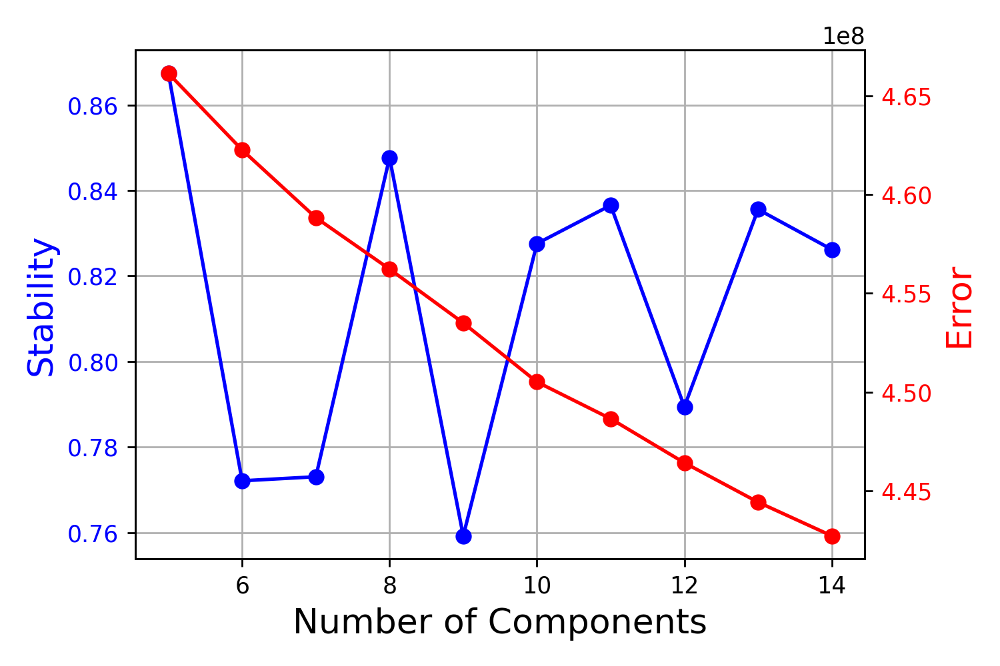

In [21]:
Image(filename = "/home/aih/shrey.parikh/PDAC/PDAC/cNMF/malignant_cNMF/malignant_cNMF.k_selection.png", width=1000, height=1000)

In [22]:
selected_K = 13
density_threshold = 2.00

In [23]:
consensus_cmd = 'python ../cNMF/cnmf.py consensus --output-dir %s --name %s --local-density-threshold %.2f --components %d --show-clustering' % (output_directory, run_name, density_threshold, selected_K)
print('Consensus command for K=6:\n%s' % consensus_cmd)
!{consensus_cmd}

Consensus command for K=6:
python ../cNMF/cnmf.py consensus --output-dir ../cNMF/ --name malignant_cNMF --local-density-threshold 2.00 --components 13 --show-clustering
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/_core/anndata.py:1906: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read`

In [25]:
density_threshold = 0.10
consensus_cmd = 'python ../cNMF/cnmf.py consensus --output-dir %s --name %s --local-density-threshold %.2f --components %d --show-clustering' % (output_directory, run_name, density_threshold, selected_K)
print('Consensus command for K=%d:\n%s' % (selected_K, consensus_cmd))
!{consensus_cmd}

Consensus command for K=13:
python ../cNMF/cnmf.py consensus --output-dir ../cNMF/ --name malignant_cNMF --local-density-threshold 0.10 --components 13 --show-clustering
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/_core/anndata.py:1906: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/aih/shrey.parikh/miniconda3/envs/PDAC/lib/python3.12/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read

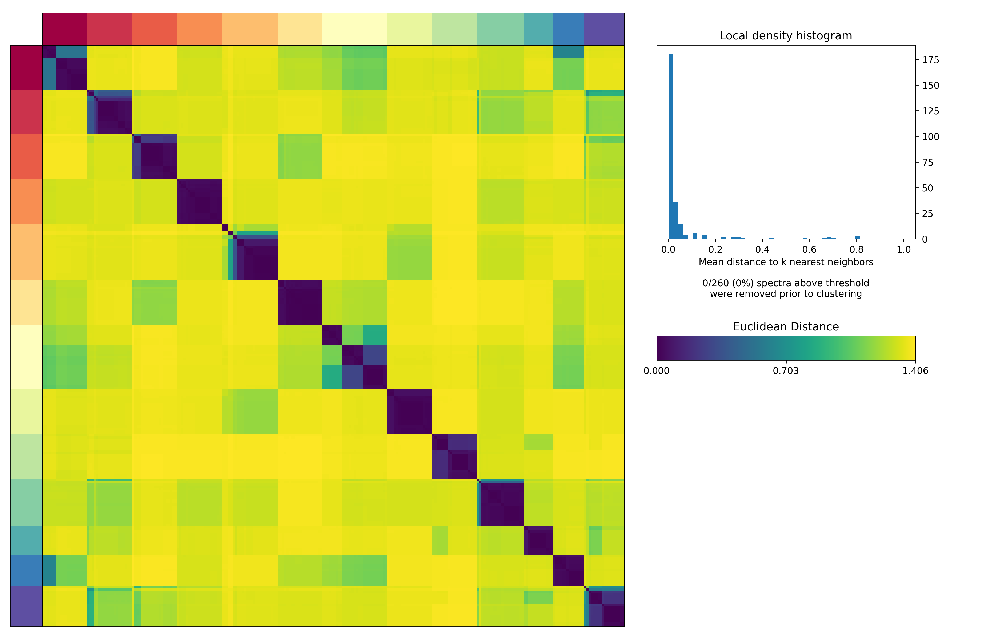

In [27]:
density_threshold_str = ('%.2f' % density_threshold).replace('.', '_')
Image(filename = "/home/aih/shrey.parikh/PDAC/PDAC/cNMF/malignant_cNMF/malignant_cNMF.clustering.k_13.dt_2_0.png",
      width=1000, height=1000)
      


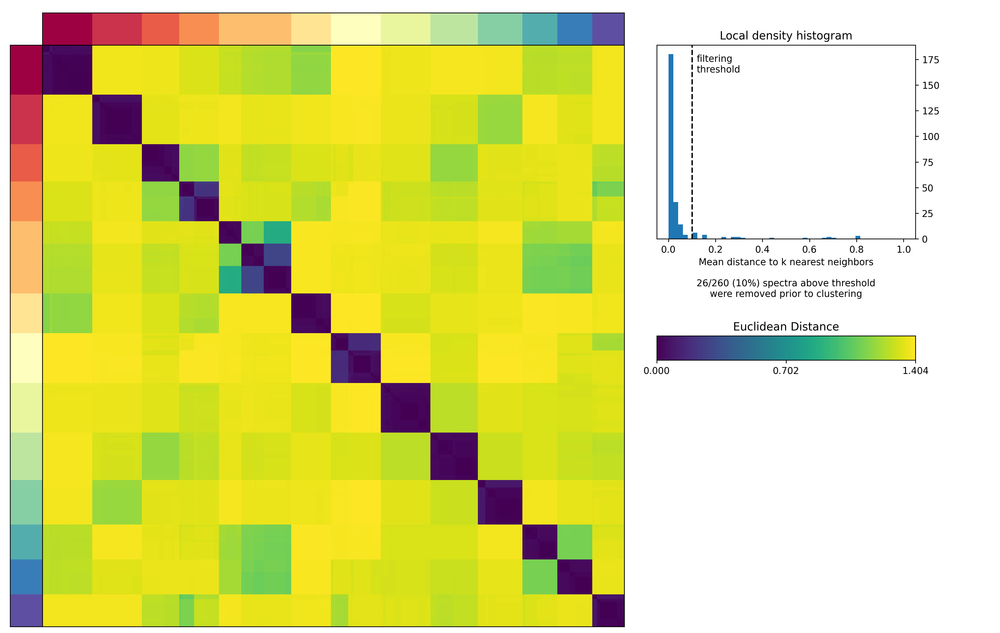

In [28]:
Image(filename = "/home/aih/shrey.parikh/PDAC/PDAC/cNMF/malignant_cNMF/malignant_cNMF.clustering.k_13.dt_0_1.png",
      width=1000, height=1000)

In [29]:
usage = pd.read_csv("/home/aih/shrey.parikh/PDAC/PDAC/cNMF/malignant_cNMF/malignant_cNMF.usages.k_13.dt_0_1.consensus.txt",
                    sep='\t', index_col=0)
usage.columns = ['Usage_%s' % i for i in usage.columns]
usage_norm = usage.div(usage.sum(axis=1), axis=0)
usage_norm.head()

,Usage_1,Usage_2,Usage_3,Usage_4,Usage_5,Usage_6,Usage_7,Usage_8,Usage_9,Usage_10,Usage_11,Usage_12,Usage_13
cell_barcode,,,,,,,,,,,,,
AAAGTCCGTTGGCCGT-1-HT056P-S1PAA1-0-0-0,0.013033,0.000000,0.471281,0.077283,0.000000,0.019325,0.129215,0.075612,0.049233,0.094259,0.065355,0.005404,0.000000
AACCACACAGGGAATC-1-HT056P-S1PAA1-0-0-0,0.125747,0.067099,0.348746,0.000000,0.085102,0.055690,0.136937,0.048883,0.000000,0.000000,0.131796,0.000000,0.000000
AACCCAATCAACCCGG-1-HT056P-S1PAA1-0-0-0,0.000000,0.000000,0.527021,0.020888,0.076697,0.016898,0.084540,0.201480,0.000000,0.012109,0.054056,0.000000,0.006311
ACACGCGTCCGACATA-1-HT056P-S1PAA1-0-0-0,0.055107,0.000000,0.300187,0.003027,0.007918,0.029723,0.130917,0.066353,0.137713,0.001702,0.262147,0.000000,0.005206
ACAGGGAAGGATCACG-1-HT056P-S1PAA1-0-0-0,0.000000,0.000000,0.152448,0.067746,0.000000,0.026840,0.030890,0.028585,0.000000,0.567110,0.126381,0.000000,0.000000


In [30]:
for cols in usage_norm.columns:
    adata_subset.obs[cols] = usage_norm[cols]

In [ ]:
usage_norm.columns

Index(['Usage_1', 'Usage_2', 'Usage_3', 'Usage_4', 'Usage_5', 'Usage_6',
       'Usage_7', 'Usage_8', 'Usage_9', 'Usage_10', 'Usage_11', 'Usage_12'],
      dtype='object')

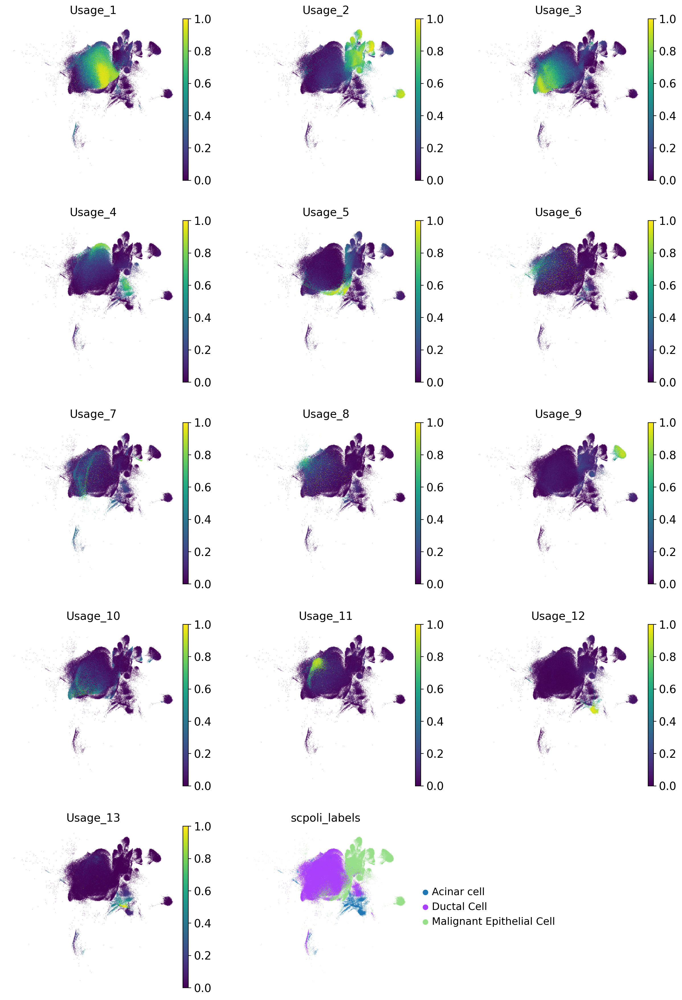

In [31]:
sc.pl.umap(adata_subset, color=['Usage_1', 'Usage_2', 'Usage_3', 'Usage_4', 'Usage_5', 'Usage_6',
       'Usage_7', 'Usage_8', 'Usage_9', 'Usage_10', 'Usage_11', 'Usage_12', 'Usage_13', 'scpoli_labels'], 
       ncols=3, vmin=0, vmax=1)

In [34]:
gene_scores = pd.read_csv("/home/aih/shrey.parikh/PDAC/PDAC/cNMF/malignant_cNMF/malignant_cNMF.spectra.k_13.dt_0_1.consensus.txt",
                    sep='\t', index_col=0).T
gene_scores.head()
top_genes = []
ngenes = 40
for gep in gene_scores.columns:
    top_genes.append(list(gene_scores.sort_values(by=gep, ascending=False).index[:ngenes]))
    
top_genes = pd.DataFrame(top_genes, index=gene_scores.columns).T
top_genes

,1,2,3,4,5,6,7,8,9,10,11,12,13
0,TFF1,NRG3,S100A4,SERPING1,KCNQ5,PTPRC,COL1A2,TYROBP,LINGO2,TOP2A,AKR1C2,MIR217HG,SYCN
1,LYZ,CCSER1,LCN2,FXYD2,VEGFC,CCL5,COL3A1,FCER1G,C5orf17,MKI67,NPW,CTNND2,PLA2G1B
2,TFF2,PTPRN2,CLIC3,CLU,ZFPM2,CD2,DCN,AIF1,EPHA6,CENPF,GPX3,PWRN1,CLPS
3,CLDN18,RASGEF1B,SNCG,SPP1,TP63,CXCR4,SPARC,FCGR2A,CDH11,TPX2,COMP,CUZD1,CELA2A
4,TFF3,AC016831.7,CST6,GC,SEMA3A,CD69,LUM,MS4A6A,PTPRM,ASPM,STC2,TRHDE,CTRC
5,PHGR1,MARCH3,S100A2,APCS,TENM3,CD3D,SFRP2,CYBB,SULF1,NUSAP1,FOLR1,NRCAM,CTRB1
6,SPINK1,CEMIP,CDA,AMBP,HMGA2,CD3E,COL1A1,MS4A7,TLR2,UBE2C,LYPD2,MYRIP,PRSS1
7,SULT1C2,AC019117.1,THBS1,SERPINA5,TENM2,IL7R,BGN,LST1,AKT3,ANLN,LDHB,SLC1A2,CTRB2
8,CEACAM5,CACNA1D,ISG15,SERPINA6,MAGI2,GZMA,COL6A3,C1QA,PRKD1,CCNB1,CPM,PNLIPRP1,AMY2A
9,MUC5AC,PCED1B,PCSK1N,SLC4A4,KCTD8,NKG7,AEBP1,SPI1,CASC15,HMMR,H19,ZBTB16,CPA1


In [ ]:
# check papers from danas lab
